## 5. fpocket
- use fpocket to predict pockets in the enzyme
- analyze the correlation between pockets and the loop regions

### 💡Results Preview 

<img src="imtd_tunnel_pockets.png" width="400" />

- In this part, I use fpocket to predict possible pockets for ligand that can be reasonably docked to the enzyme.
- Several pockets are screened for further use that present in catalytic tunnel and adjacent to the loop region.

### 5.1 Deployment
- installation and environment preparation

In [ ]:
brew install fpocket

In [ ]:
git clone https://github.com/Discngine/fpocket.git
cd fpocket
make

### 5.2 Pockets prediction
- input pdb files
- use the command below to predict

In [ ]:
fpocket -f BfIMTD_relaxed_r1.pdb

- output files with pockets in [results/fpocket]
- use the following command to visualize results inPyMol

In [ ]:
python BfIMTD_relaxed_r1_PYMOL.sh

In [ ]:
load BfIMTD_relaxed_r1.pdb
load BfIMTD_relaxed_r1_out/pockets/pocket0_atm.pdb
color red, pocket0_atm

### 5.3 Result analysis
#### 5.3.1 extract residues from every pocket
- use the following script to extract residues of each pocket
- pocket residue summaries are saved in [results/fpocket/BfIMTD_relaxed_r1_out/pocket]

In [ ]:
import os
import csv

root_dir = input("Enter the full path to your fpockets directory:")
pocket_out_dir = os.path.join(root_dir, "pockets")
# output_dir = input("Enter the output path:")
if not os.path.isdir(pocket_out_dir):
    print("Error: provided path is not a directory.")
    exit(1)

print(f"\n Scanning directory...{pocket_out_dir}")
print("Files found:", os.listdir(pocket_out_dir))
# if pocket_out_dir == '':
#     pocket_out_dir = '.'
# os.makedirs(output_dir, exist_ok=True)
pocket_data = []

# output_lines = []
for fname in sorted(os.listdir(pocket_out_dir)):
    print(f"Checking file: {fname}")
    if fname.startswith("pocket") and fname.endswith("_atm.pdb"):
        try:
            pocket_index = int(fname[len("pocket"): fname.index("_atm.pdb")])
        except ValueError:
            continue

        path = os.path.join(pocket_out_dir, fname)
        residues = set()

        with open(path)as f:
            for line in f:
                if line.startswith("ATOM"):
                    resid = int(line[22:26])
                    residues.add(resid)
        if residues:
            pocket_data.append((pocket_index, sorted(residues)))

pocket_data.sort(key=lambda x:x[0])

csv_path = os.path.join(pocket_out_dir, "fpocket_residues.csv")
with open(csv_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(["Pocket_Index", "Residues"])
    for pocket_index, residues in pocket_data:
        writer.writerow([pocket_index, ";".join(map(str, residues))])

print(f"\n Pocket residue summary saved to {csv_path}")


- pocket summary
| Enzyme | pocket number from fpocket | 
|:----:|:----:|
| BfIMTD |  33  |  
| DexKQ |  26  |  
| CcDex |  38  |  
| MrDex |  33  | 
| IPU | 23  | 
- Detailed residue index are included in each enzyme's csv file.

#### 5.3.2 analyze the distance between loop and pockets

- calculate the distance between the loop and every pocket
- screen adjacent pockets for further analysis

In [2]:
pwd

'/Volumes/APFS/protein_prediction/protein_structure_loop_analysis/notebooks'

In [27]:
# step 0: input path and loop region

import os
import numpy as np
import pandas as pd
from Bio.PDB import PDBParser
from scipy.spatial.distance import cdist

main_pdb = input("Enter path to main protein PDB file (e.g., BfIMTD_relaxed_r1.pdb): ").strip()
fpocket_dir = input("Enter path to fpocket output folder (e.g., BfIMTD_relaxed_r1_out/pockets/): ").strip()
loop_range_str = input("Enter loop residue range (e.g., 392-402): ").strip()
enzyme_name = input("Enter enzyme name: ").strip()

loop_start, loop_end = map(int, loop_range_str.split("-"))
loop_residues = list(range(loop_start, loop_end + 1))

Enter path to main protein PDB file (e.g., BfIMTD_relaxed_r1.pdb):  /Volumes/APFS/protein_prediction/protein_structure_loop_analysis/results/fpocket/MrDex719_d585d_relaxed_rank_001_alphafold2_ptm_model_3_seed_000_out/MrDex719_d585d_relaxed_rank_001_alphafold2_ptm_model_3_seed_000_out.pdb
Enter path to fpocket output folder (e.g., BfIMTD_relaxed_r1_out/pockets/):  /Volumes/APFS/protein_prediction/protein_structure_loop_analysis/results/fpocket/MrDex719_d585d_relaxed_rank_001_alphafold2_ptm_model_3_seed_000_out/pockets
Enter loop residue range (e.g., 392-402):  381-391
Enter enzyme name:  mrdex


In [28]:
# step 1: load main structure & loop atoms

parser = PDBParser(QUIET=True)
structure = parser.get_structure("main", main_pdb)
model = structure[0]

loop_atoms = []
for chain in model:
    for res in chain:
        if res.id[0] == " " and res.id[1] in loop_residues:
            for atom in res:
                loop_atoms.append((res.id[1], atom.coord))

if not loop_atoms:
    raise ValueError("No loop atoms found in the specified range!")
    
loop_coords = np.array([coord for _, coord in loop_atoms])

In [29]:
# step 2: loop over pocket pdbs and compute distances

data = []
contact_threshold = 5.0 ### calculate contact atom pairs 

for fname in sorted(os.listdir(fpocket_dir)):
    if fname.startswith("pocket") and fname.endswith("_atm.pdb"):
        pocket_path = os.path.join(fpocket_dir, fname)
        pocket_id = fname.split("_")[0]  # e.g., pocket0

        pocket_atoms = []
        structure_pocket = parser.get_structure(pocket_id, pocket_path)
        for chain in structure_pocket[0]:
            for res in chain:
                if res.id[0] == " ":
                    for atom in res:
                        pocket_atoms.append((res.id[1], atom.coord))

        # remove duplicate residues both in loop and pocket
        loop_atoms_filtered = [atom for atom in loop_atoms if atom[0] not in {resid for resid, _ in pocket_atoms}]
        pocket_atoms_filtered = [atom for atom in pocket_atoms if atom[0] not in {resid for resid, _ in loop_atoms}]

        loop_coords = np.array([coord for _, coord in loop_atoms_filtered])
        pocket_coords = np.array([coord for _, coord in pocket_atoms_filtered])

        # skip when no atoms left
        if len(loop_coords) == 0 or len(pocket_coords) == 0:
            print(f"⚠️ Skipping {pocket_id}: No non-overlapping atoms.")
            continue

        dists = cdist(loop_coords, pocket_coords)
        min_dist = np.min(dists)
        avg_dist = np.mean(dists)

        # Identify contacting residue pairs
        contacts = np.where(dists < contact_threshold)
        contact_pairs = [(loop_atoms_filtered[i][0], pocket_atoms_filtered[j][0]) for i, j in zip(*contacts)]
        contact_residues = sorted(set(res for _, res in contact_pairs))

        data.append({
            "PocketID": pocket_id,
            "MinDistance": round(min_dist, 2),
            "AvgDistance": round(avg_dist, 2),
            "NumContacts": len(contact_pairs),
            "ContactPocketResidues": contact_residues
        })

In [30]:
# step 3: save full pocket-loop distance data
output_dir = os.path.join("..", "results", "fpocket")
os.makedirs(output_dir, exist_ok=True)

csv_all = os.path.join(output_dir, f"{enzyme_name}_loop_pocket_all_distances.csv")
csv_candidate = os.path.join(output_dir, f"{enzyme_name}_loop_pocket_functional_candidate.csv")

df_all = pd.DataFrame(data)
df_all.to_csv(csv_all, index=False)
print("✅ Saved all pocket-loop distance results to loop_pocket_all_distances.csv")

✅ Saved all pocket-loop distance results to loop_pocket_all_distances.csv


In [31]:
# step 4: select most likely functional pockets
# (criteria: min distance < 4Å and NumContacts >= 3)

candidate_df = df_all[(df_all.MinDistance < 4.0) & (df_all.NumContacts >= 3)]
candidate_df.to_csv(csv_candidate, index=False)
print("🎯 Saved candidate functional pockets to loop_pocket_candidate_functional.csv")

🎯 Saved candidate functional pockets to loop_pocket_candidate_functional.csv


#### 5.3.3 adjacent pockets summary

#### 1. **BfIMTD's adjacent pockets** 
- This table contains all pockets whose minimal distance is less than 6 Å

| Enzyme | Pocket near loop | Related residues |
|:----:|:----:|:----:|
| BfIMTD |  4  | 316;365;366;367;391;392;393;398;399;401 |
|  |  7  | 402;404;427;428;449 |
|  |  28  | 354;388;389;390;397;398;399;400;424;426;447;473 |
|  |  29  | 352;354;384;385;397;419;421;424;440;441;444;446;470;471;473;498;508 |
|  | 31  | 316;317;318;319;366;368;369;370 |
|  | 32  | 312;314;315;316;364;392;394;395 |

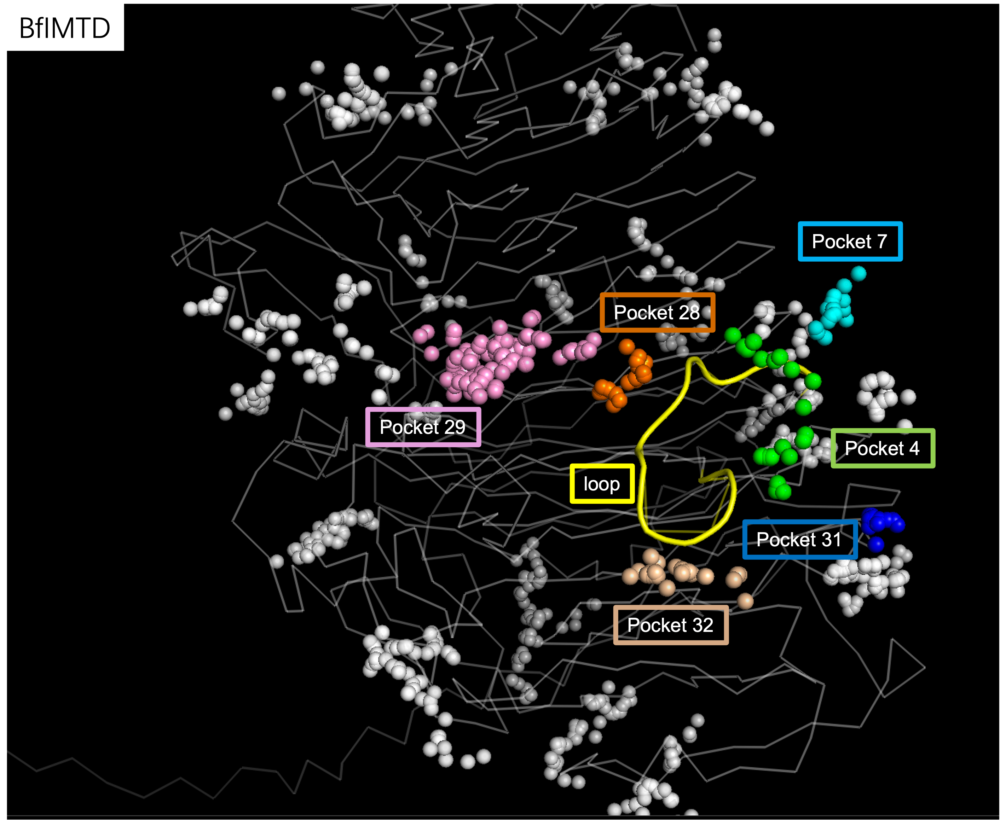

In [38]:
# Related views in PyMol

from IPython.display import Image, display
display(Image(filename="imtd_loop_near_pockets.png", width=600))

#### 2. **CcDex's adjacent pockets** 
- This table contains all pockets whose minimal distance is less than 6 Å

| Enzyme | Pocket near loop | Related residues |
|:----:|:----:|:----:|
| CcDex |  17  | 317;318;320;366;368;369;370 |
|  |  18  | 354;385;388;390;419;421;424;440;441;444;446;470 |
|  |  23  | 313;315;317;364;392;394 |
|  |  31  | 342;350;352;353;354;355;356;397 |
|  | 32  | 317;365;366;367;391;392;393;398;399;401 |
|  | 33  | 388;389;390;397;398;399;400;424;426;447;473 |

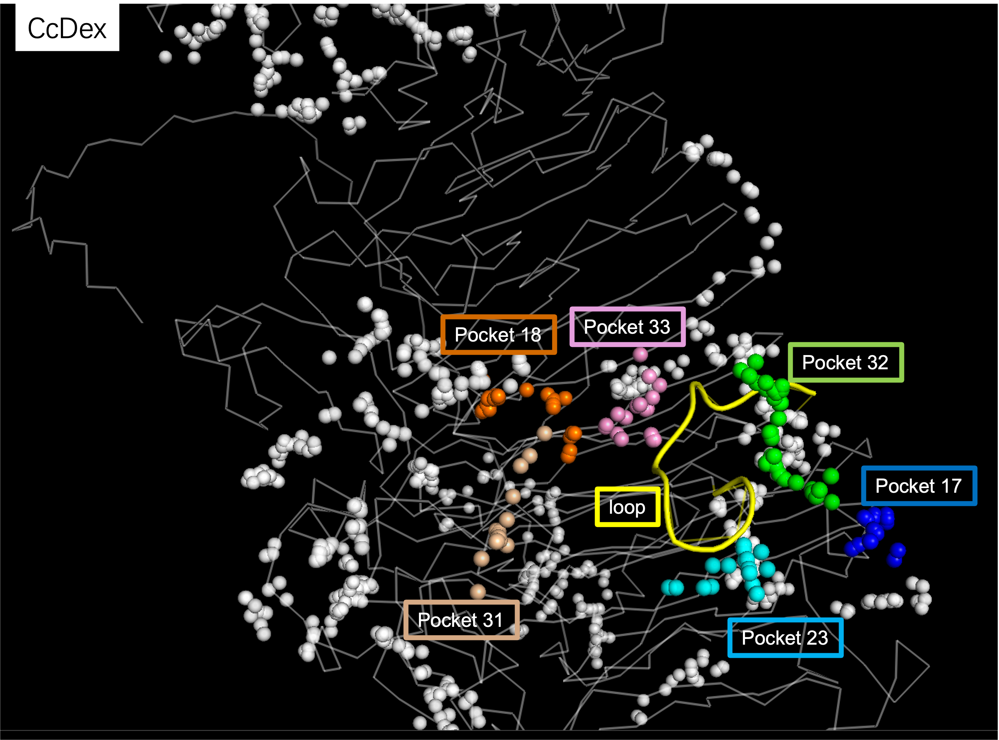

In [39]:
display(Image(filename="cc_loop_near_pockets.png", width=600))

#### 3. **MrDex's adjacent pockets** 
- This table contains all pockets whose minimal distance is less than 6 Å

| Enzyme | Pocket near loop | Related residues |
|:----:|:----:|:----:|
| MrDex |  19  | 355;356;380;381;382;383;387|
|  | 32  | 3;4;5;6;386;388;459;460;461;462;496;497;498;505;506;507;510;568 |
|  | 33  | 1;2;3;4;5;6;7;8;9;10;11;340;341;343;356;374;377;378;379;380;382;384;385;386;387;388;389;390;408;410;413;415;416;429;430;433;435;436;437;451;459;461;462;463;487;497;498;500;507;509;510 |

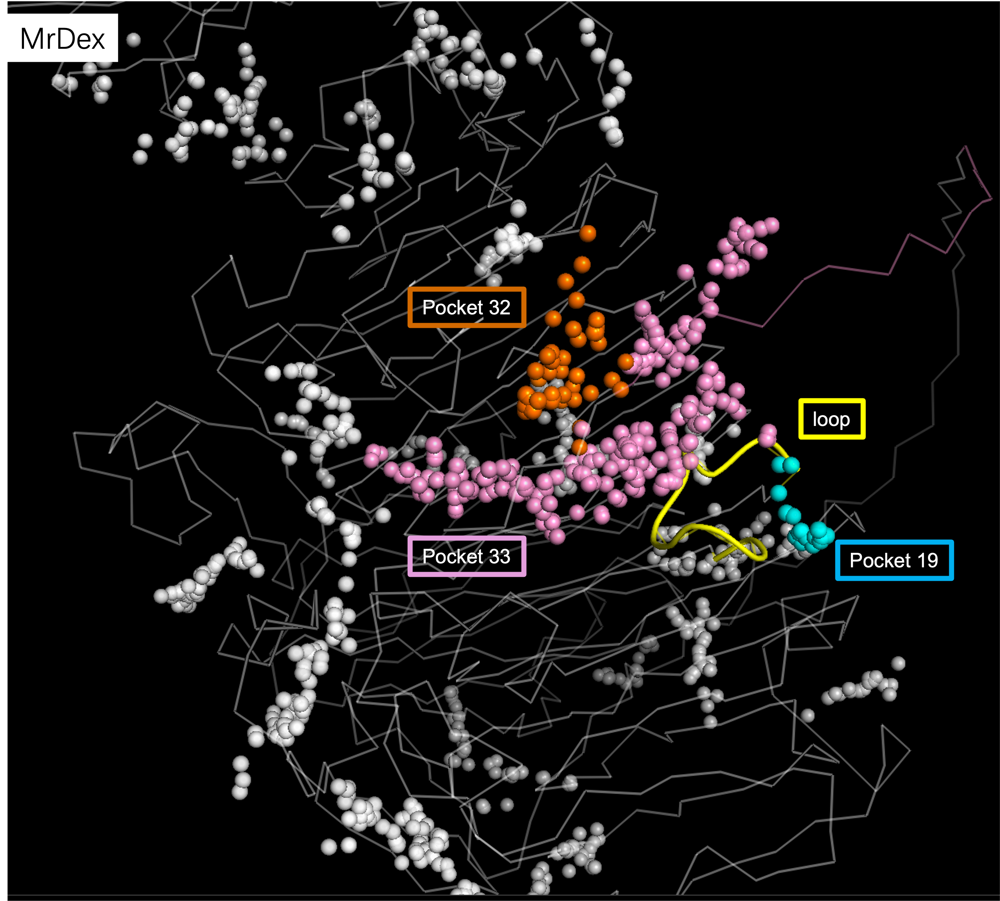

In [43]:
display(Image(filename="mr_loop_near_pockets.png", width=600))

### 5.4 Results and Conclusion
1. I utilized fpocket to predict possible ligand-binding pockets of every enzyme structure.
2. To explore potential functional relevance of the loop region, I also calculate the spatial distances between each pocket and the loop. Among the predicted pockets, several were found to be in close prosimity to the loop.
3. I use Pymol to display the spatial relationship between these pockets and loop.
4. BfIMTD's pocket 28 and p29 are inside the catalytica tunnels and very near to the loop.
5. **P28 and P29** can be the potential pockets for further analysis, docking and MD.
- Negative and Positive sites are concluded from structural alignments between BfIMTD and Dex49A (its structure has already been revealed and catalytic residues have been identified.)

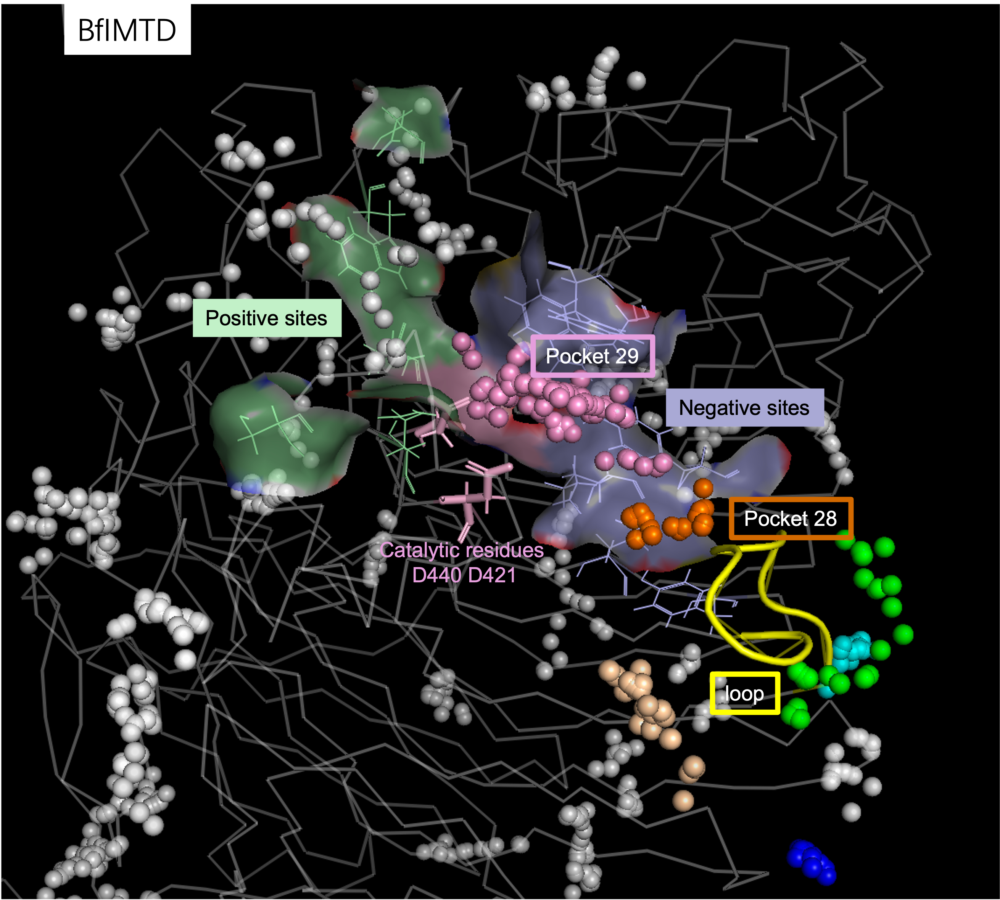

In [41]:
display(Image(filename="imtd_tunnel_pockets.png", width=800))

4. So as CcDex and MrDex, CcDex's pocket 18 and p33, MrDex's pocket 33 are inside their catalytica tunnels and very near to the loop.
5. These pockets can be the potential pockets for further analysis, docking and MD.

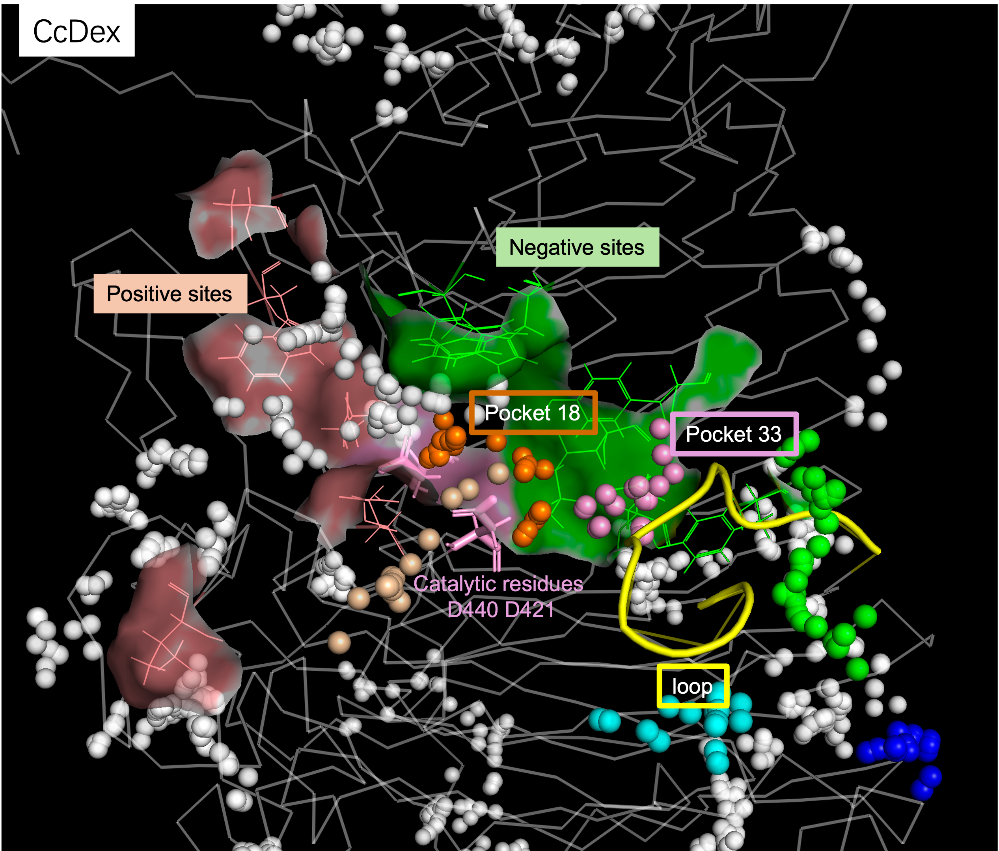

In [46]:
display(Image(filename="cc_tunnel_pockets.png", width=800))

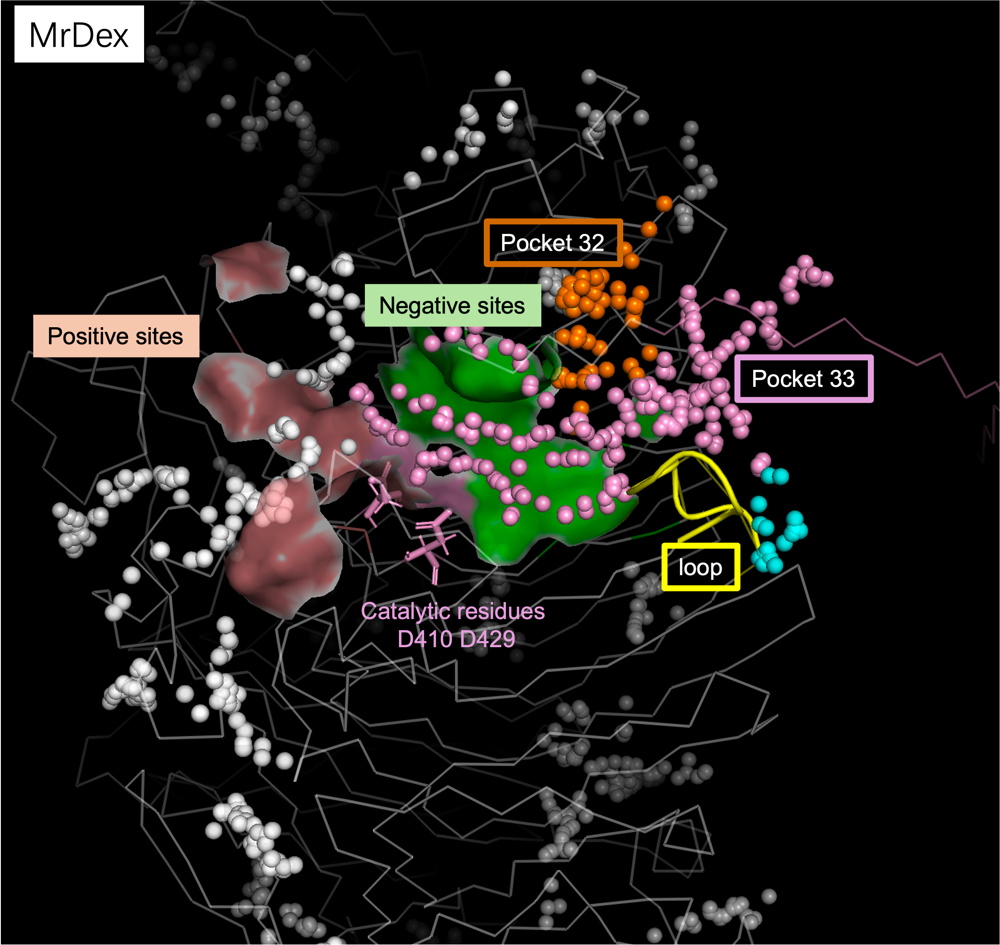

In [45]:
display(Image(filename="mr_tunnel_pockets.png", width=800))

### Discussion
- As visualized in PyMol snapshots above, these pockets are spatially adjacent to the loop and might be part of a functional interface or a substrate-tunnel regulated by the loop flexibility.
- These findings support my hypothesis that the loop might play a vital role in enzyme performing its novel specificity like controlling substrate entry or modulating pocket's flexible lid.

#### Reference:
1. Salentin S, Schreiber S, Haupt VJ, Adasme MF, Schroeder M. PLIP: fully automated protein-ligand interaction profiler. Nucleic Acids Res. 2015 Jul 1;43(W1):W443-7. doi: 10.1093/nar/gkv315. Epub 2015 Apr 14. PMID: 25873628; PMCID: PMC4489249.
2. https://fpocket.sourceforge.net/